In [5]:
import pandas as pd
import numpy as np
import pm4py
from variant_stats import get_variants_stats
from pm4py.util import ml_utils
import importlib.util
from pm4py.algo.discovery.heuristics import algorithm as heuristics_miner
from pm4py.visualization.heuristics_net import visualizer as hn_visualizer
from sklearn.cluster import SpectralClustering
from sklearn.feature_extraction.text import TfidfVectorizer

In [4]:
df2 = pd.read_pickle('decision_paths/subset_optimized_simple_size_0.2_fitnessweights_p0.34_f0.33_c0.33_weightmodel_weight_positive_simplified.pickle')

# Initialize an empty list to hold event log rows
event_log0 = []
event_log1 = []

# Iterate over each decision path in the dataset
timestamp = pd.Timestamp('2024-11-14')
case_id = -1
for i in range(len(df2)):
    data = df2['rule_to_simplified_rules'].iloc[i]
    for path in data:
        case_id += 1
        for t,step in enumerate(path):
            # Create an event dictionary for the current step
            event = {
                'case_id': case_id,
                'activity': step.get('feature_value'),
                'timestamp': timestamp + pd.Timedelta(days=t)
            }
            # if event['activity'] in to_remove:
            #     # print(f" I removed {event['activity']} from the log")
            #     continue
            if pd.isna(event['activity']):
                event['activity'] = f'predict{step['predict']}'

            
            # Append the event to the event log
            if path[-1]['predict'] == 1:
                event_log1.append(event)
            else:
                event_log0.append(event)

event_log1 = pd.DataFrame(event_log1)
event_log0 = pd.DataFrame(event_log0)
log1 = event_log1.copy()
log1.rename(columns={'timestamp': 'time:timestamp', 'case_id': 'case:concept:name', 'activity': 'concept:name'}, inplace=True)

log0 = event_log0.copy()
log0.rename(columns={'timestamp': 'time:timestamp', 'case_id': 'case:concept:name', 'activity': 'concept:name'}, inplace=True)

df0 = get_variants_stats(log0)
df1 = get_variants_stats(log1)

In [3]:
log1 = event_log1.copy()
log1.rename(columns={'timestamp': 'time:timestamp', 'case_id': 'case:concept:name', 'activity': 'concept:name'}, inplace=True)

log0 = event_log0.copy()
log0.rename(columns={'timestamp': 'time:timestamp', 'case_id': 'case:concept:name', 'activity': 'concept:name'}, inplace=True)

df0 = get_variants_stats(log0)
df1 = get_variants_stats(log1)

In [6]:
trace_strings = [' '.join(trace) for trace in df0['sequence']]
# Apply TF-IDF
vectorizer = TfidfVectorizer()
X = vectorizer.fit_transform(trace_strings)  # X is a matrix (n_traces x n_activities)

100%|██████████████████████████████████████████████████████████████████████████████████| 28/28 [00:01<00:00, 18.56it/s]


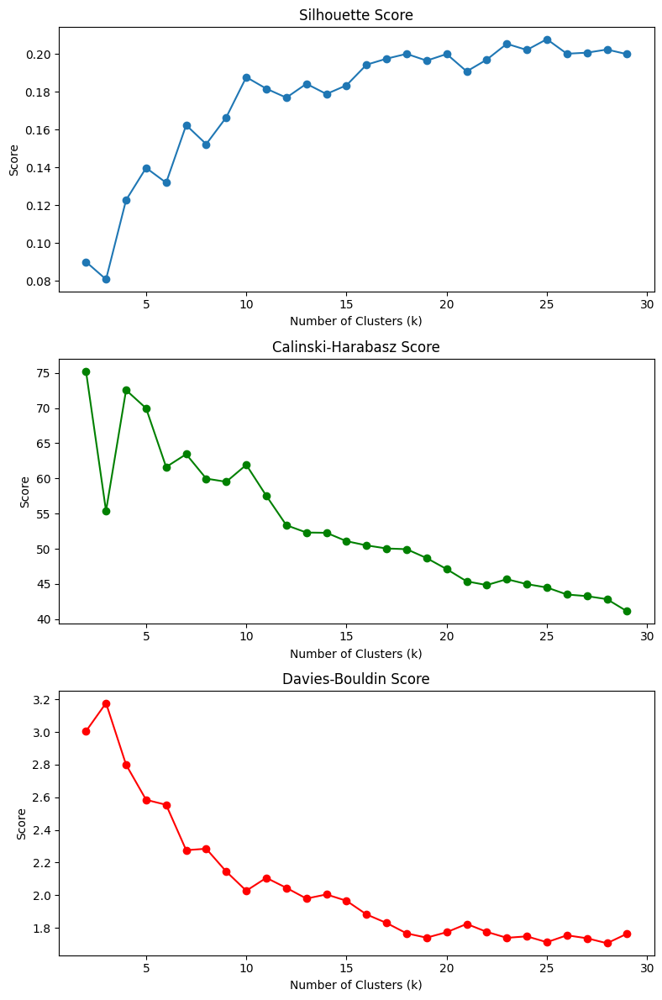

In [7]:
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score, calinski_harabasz_score, davies_bouldin_score
import matplotlib.pyplot as plt
from tqdm import tqdm

# Store scores for different cluster numbers
k_values = range(2, 30)  # Up to len(traces)-1
silhouette_scores = []
calinski_scores = []
davies_scores = []

# Run KMeans and calculate clustering scores
for k in tqdm(k_values):
    # clustering = SpectralClustering(n_clusters=k, assign_labels='discretize', random_state=0).fit(X)
    # labels = clustering.labels_
    kmeans = KMeans(n_clusters=k, random_state=42)
    labels = kmeans.fit_predict(X)

    silhouette_scores.append(silhouette_score(X, labels))
    calinski_scores.append(calinski_harabasz_score(X.toarray(), labels))
    davies_scores.append(davies_bouldin_score(X.toarray(), labels))

# Plotting
fig, axs = plt.subplots(3, 1, figsize=(8, 12))

# Silhouette Score
axs[0].plot(k_values, silhouette_scores, marker='o')
axs[0].set_title("Silhouette Score")
axs[0].set_xlabel("Number of Clusters (k)")
axs[0].set_ylabel("Score")

# Calinski-Harabasz Index
axs[1].plot(k_values, calinski_scores, marker='o', color='green')
axs[1].set_title("Calinski-Harabasz Score")
axs[1].set_xlabel("Number of Clusters (k)")
axs[1].set_ylabel("Score")

# Davies-Bouldin Index (lower is better)
axs[2].plot(k_values, davies_scores, marker='o', color='red')
axs[2].set_title("Davies-Bouldin Score")
axs[2].set_xlabel("Number of Clusters (k)")
axs[2].set_ylabel("Score")

plt.tight_layout()
plt.show()

In [8]:
spect = SpectralClustering(n_clusters=10, random_state=42)
labels = spect.fit_predict(X)


    ################################
    #           Cluster 0         #
    ################################
    


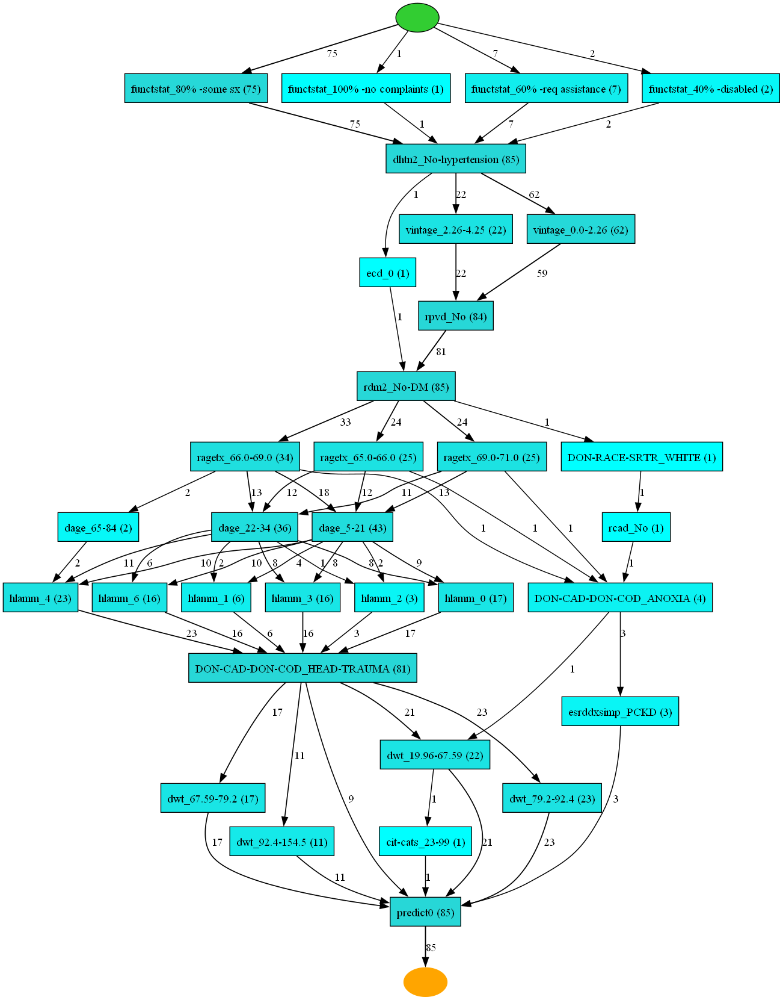


    ################################
    #           Cluster 1         #
    ################################
    


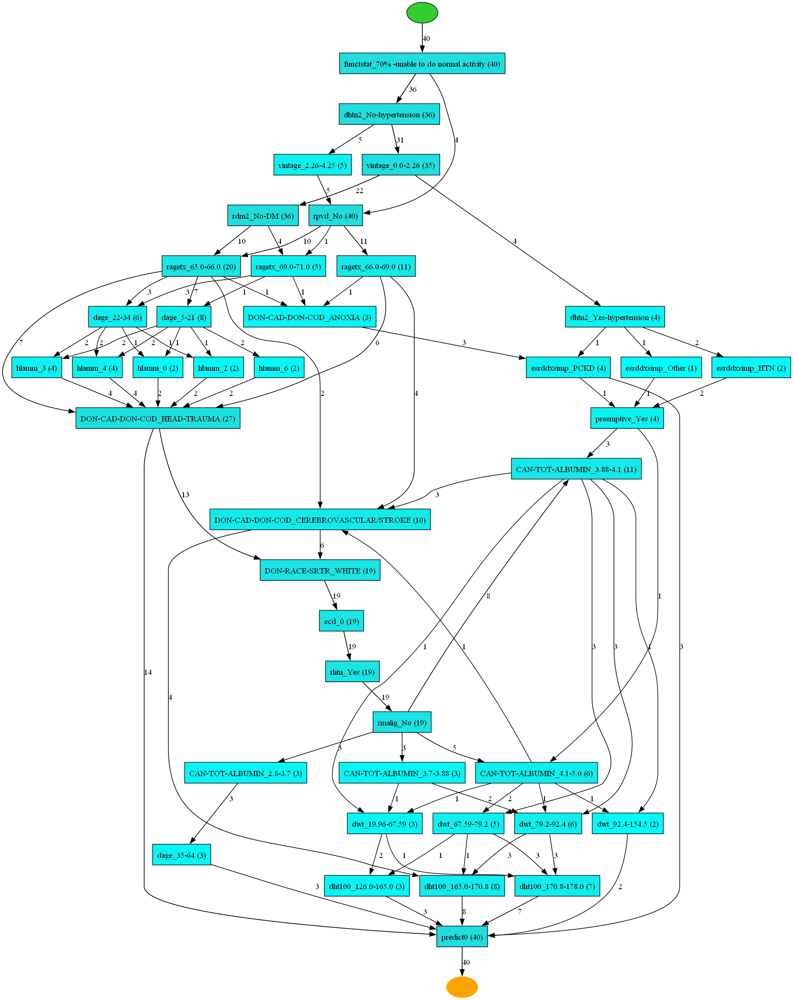


    ################################
    #           Cluster 2         #
    ################################
    


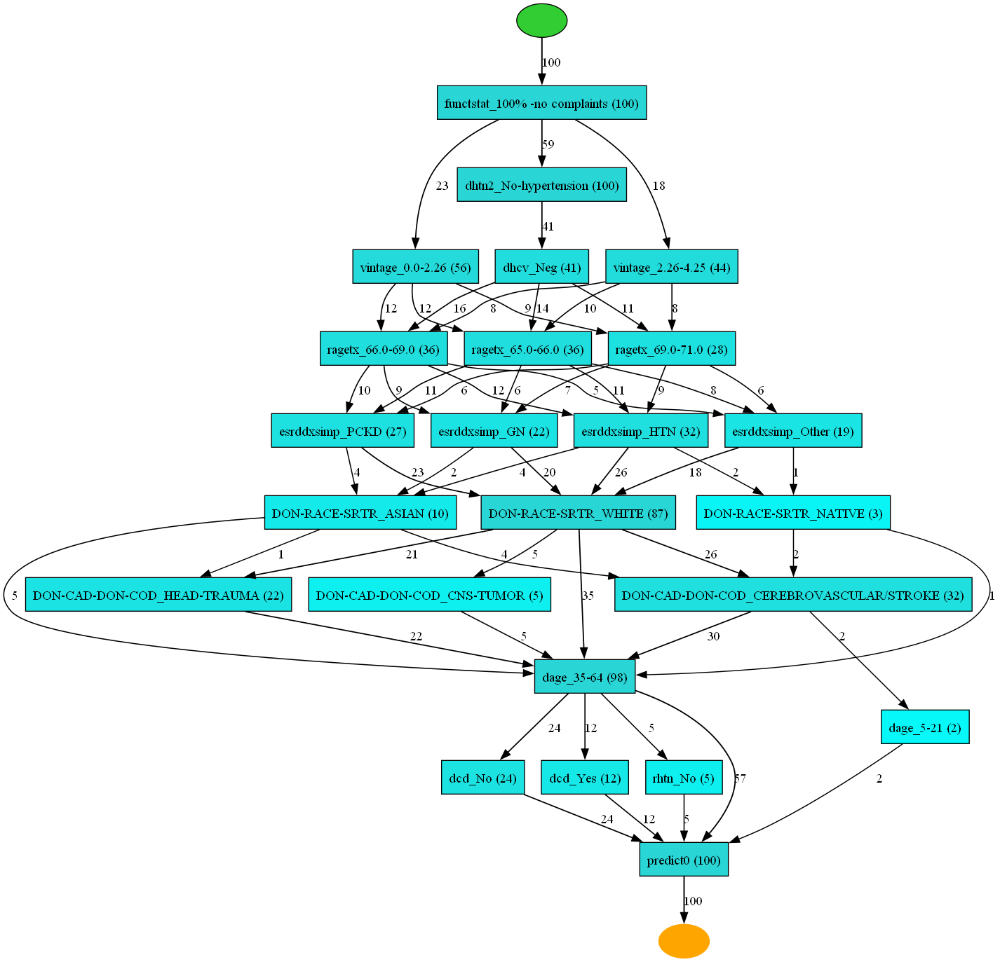


    ################################
    #           Cluster 3         #
    ################################
    


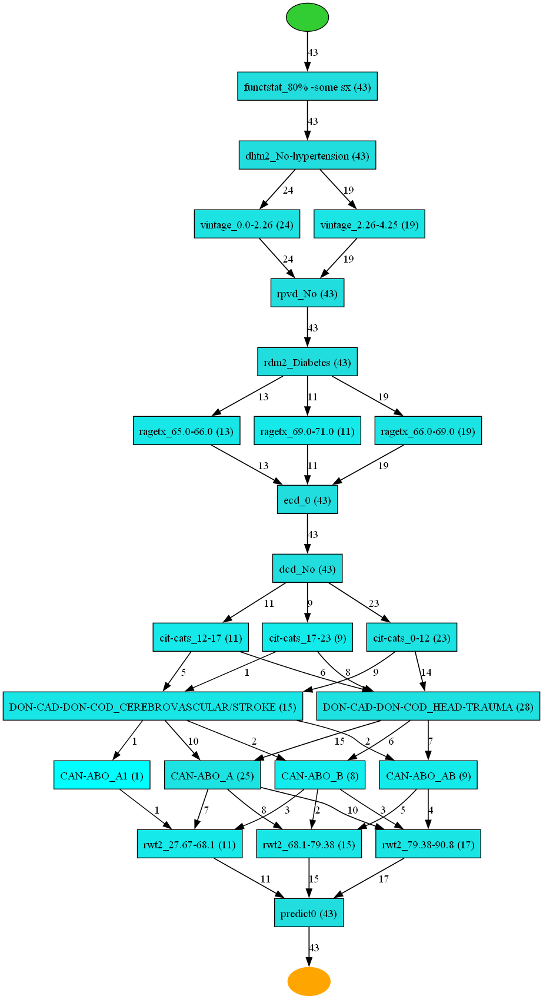


    ################################
    #           Cluster 4         #
    ################################
    


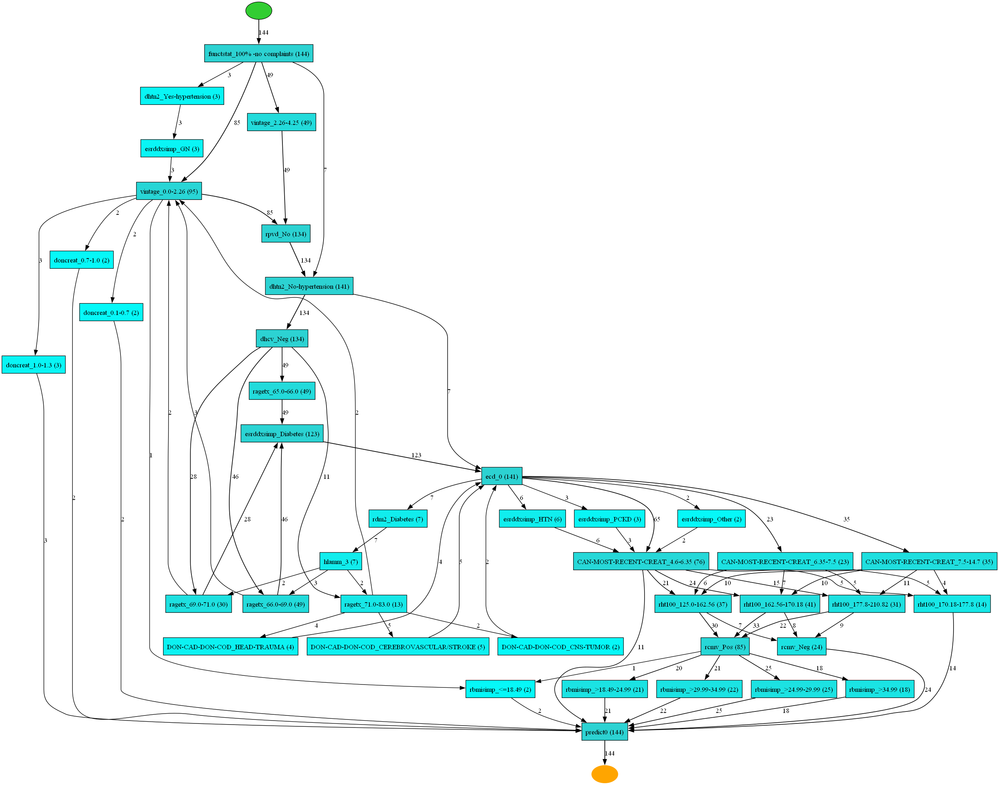


    ################################
    #           Cluster 5         #
    ################################
    


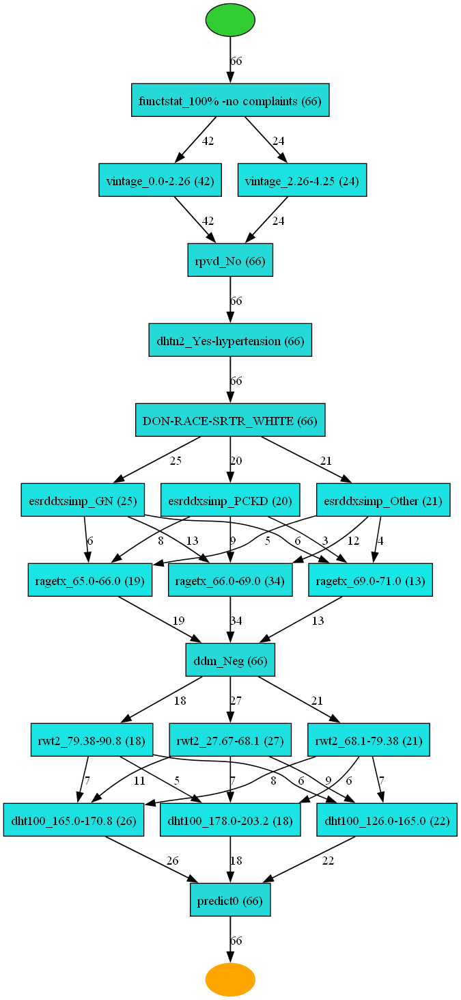


    ################################
    #           Cluster 6         #
    ################################
    


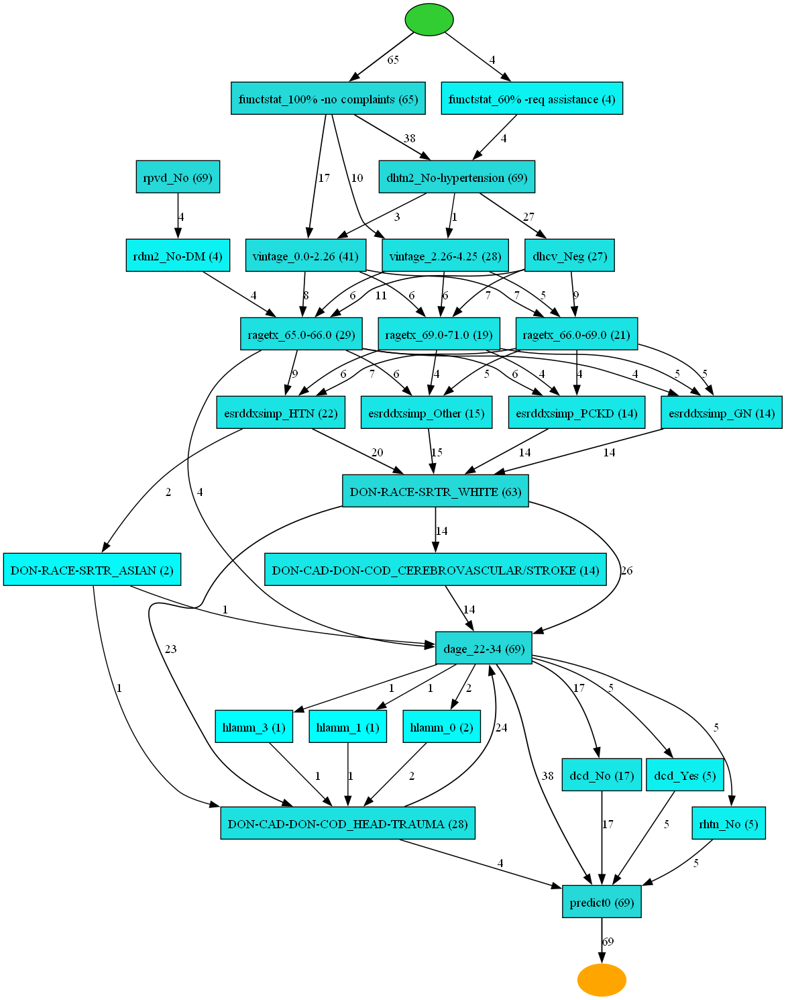


    ################################
    #           Cluster 7         #
    ################################
    


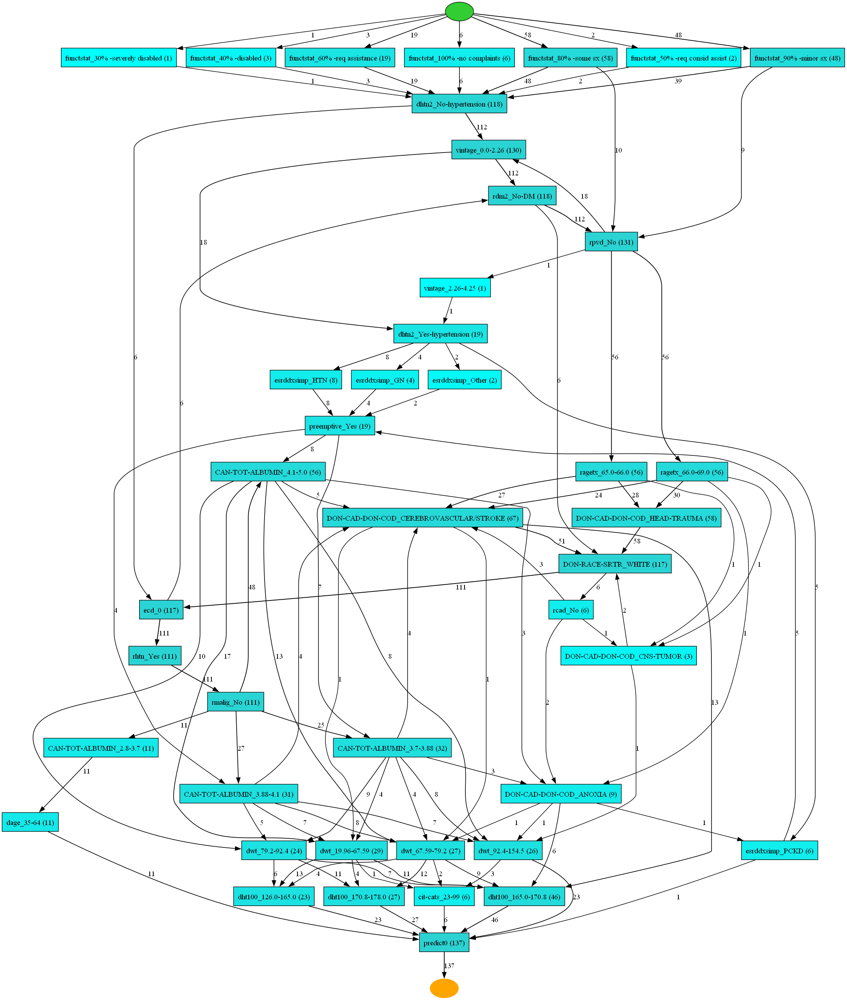


    ################################
    #           Cluster 8         #
    ################################
    


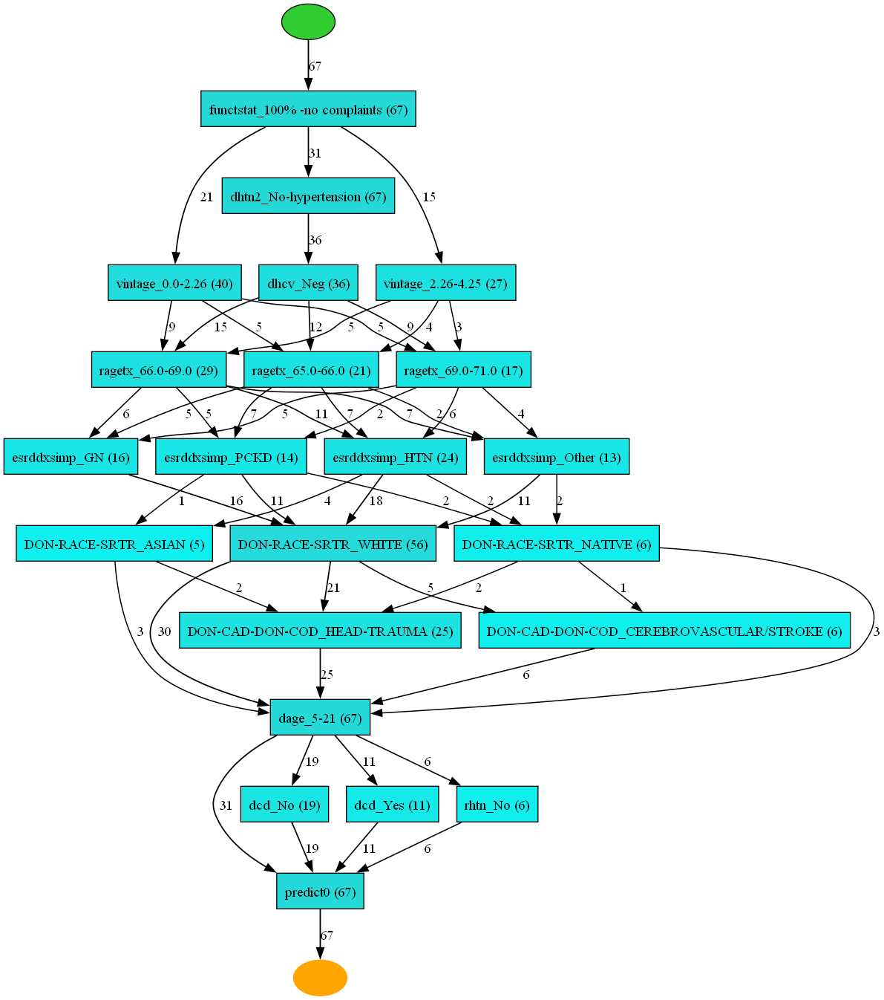


    ################################
    #           Cluster 9         #
    ################################
    


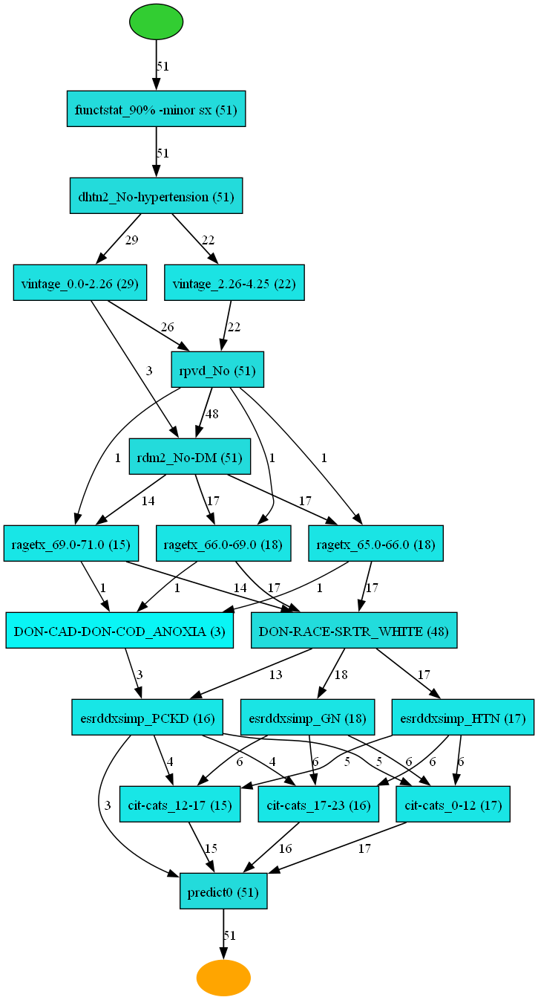

In [10]:
from pm4py.objects.log.obj import EventLog, Trace
from datetime import datetime, timedelta

for ix in range(10):
    print("""
    ################################
    #           Cluster {}         #
    ################################
    """.format(ix))
    sequences = df0.iloc[labels==ix]['sequence']
    
    # Create an empty event log
    event_log = EventLog()
    
    # Define base timestamp
    base_time = datetime(2024, 1, 1, 0, 0, 0)
    
    # Loop through each sequence
    for idx, sequence in enumerate(sequences):
        trace = Trace()
        case_id = f"Case_{idx+1}"
        
        for i, activity in enumerate(sequence):
            event = {
                "case:concept:name": case_id,
                "concept:name": activity,
                "time:timestamp": base_time + timedelta(minutes=i)
            }
            trace.append(event)
        
        event_log.append(trace)
    
    heu_net = heuristics_miner.apply_heu(event_log)
    
    # visualize
    gviz = hn_visualizer.apply(heu_net)
    hn_visualizer.view(gviz)

In [11]:
from pm4py.algo.discovery.inductive import algorithm as inductive_miner
from pm4py.algo.evaluation import algorithm as general_evaluation
from pm4py.objects.log.importer.xes import importer as xes_importer
from pm4py.objects.conversion.process_tree import converter as process_tree_converter
def execute_script(log):
    process_tree = inductive_miner.apply(log)
    net, marking, final_marking = process_tree_converter.apply(process_tree)
    metrics = general_evaluation.apply(log, net, marking, final_marking)
    print("metrics=", metrics)

In [13]:
import pandas as pd
from pm4py.algo.discovery.inductive import algorithm as inductive_miner
from pm4py.algo.evaluation import algorithm as general_evaluation
from pm4py.objects.conversion.process_tree import converter as process_tree_converter

def evaluate_log(log, log_name="log"):
    process_tree = inductive_miner.apply(log)
    net, marking, final_marking = process_tree_converter.apply(process_tree)
    metrics = general_evaluation.apply(log, net, marking, final_marking)

    # Extract and flatten relevant metrics
    result = {
        "log_name": log_name,
        "fitness_perc_fit_traces": metrics["fitness"]["perc_fit_traces"],
        "fitness_avg_trace_fitness": metrics["fitness"]["average_trace_fitness"],
        "fitness_log_fitness": metrics["fitness"]["log_fitness"],
        "fitness_perc_fitting_traces": metrics["fitness"]["percentage_of_fitting_traces"],
        "precision": metrics["precision"],
        "generalization": metrics["generalization"],
        "simplicity": metrics["simplicity"],
        "metricsAverageWeight": metrics["metricsAverageWeight"],
        "fscore": metrics.get("fscore", None)
    }
    return result

# Example: loop over multiple logs
all_results = []

from pm4py.objects.log.importer.xes import importer as xes_importer

for ix in range(10):
    print(f"###################{ix}#################")
    sequences = df0.iloc[labels==ix]['sequence']
    
    # Create an empty event log
    event_log = EventLog()
    
    # Define base timestamp
    base_time = datetime(2024, 1, 1, 0, 0, 0)
    
    # Loop through each sequence
    for idx, sequence in enumerate(sequences):
        trace = Trace()
        case_id = f"Case_{idx+1}"
        
        for i, activity in enumerate(sequence):
            event = {
                "case:concept:name": case_id,
                "concept:name": activity,
                "time:timestamp": base_time + timedelta(minutes=i)
            }
            trace.append(event)
        
        event_log.append(trace)
    metrics = evaluate_log(event_log, log_name=ix)
    all_results.append(metrics)

# Convert to DataFrame
df_results = pd.DataFrame(all_results)
df_results

###################0#################


replaying log with TBR, completed traces ::   0%|          | 0/85 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/254 [00:00<?, ?it/s]

###################1#################


replaying log with TBR, completed traces ::   0%|          | 0/40 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/141 [00:00<?, ?it/s]

###################2#################


replaying log with TBR, completed traces ::   0%|          | 0/100 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/318 [00:00<?, ?it/s]

###################3#################


replaying log with TBR, completed traces ::   0%|          | 0/43 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/146 [00:00<?, ?it/s]

###################4#################


replaying log with TBR, completed traces ::   0%|          | 0/144 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/311 [00:00<?, ?it/s]

###################5#################


replaying log with TBR, completed traces ::   0%|          | 0/66 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/155 [00:00<?, ?it/s]

###################6#################


replaying log with TBR, completed traces ::   0%|          | 0/69 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/263 [00:00<?, ?it/s]

###################7#################


replaying log with TBR, completed traces ::   0%|          | 0/137 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/461 [00:00<?, ?it/s]

###################8#################


replaying log with TBR, completed traces ::   0%|          | 0/67 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/245 [00:00<?, ?it/s]

###################9#################


replaying log with TBR, completed traces ::   0%|          | 0/51 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/97 [00:00<?, ?it/s]

,log_name,fitness_perc_fit_traces,fitness_avg_trace_fitness,fitness_log_fitness,fitness_perc_fitting_traces,precision,generalization,simplicity,metricsAverageWeight,fscore
0,0,100.0,1.0,1.0,100.0,0.152671,0.623344,0.461538,0.559388,0.264899
1,1,100.0,1.0,1.0,100.0,0.235744,0.604231,0.603865,0.610960,0.381541
2,2,100.0,1.0,1.0,100.0,0.280424,0.781488,0.528090,0.647500,0.438017
3,3,100.0,1.0,1.0,100.0,0.611919,0.750483,0.653333,0.753934,0.759243
4,4,100.0,1.0,1.0,100.0,0.127265,0.703497,0.530864,0.590407,0.225795
5,5,100.0,1.0,1.0,100.0,0.927273,0.814577,0.666667,0.852129,0.962264
6,6,100.0,1.0,1.0,100.0,0.386757,0.718356,0.600000,0.676278,0.557786
7,7,100.0,1.0,1.0,100.0,0.123731,0.737486,0.563636,0.606213,0.220215
8,8,100.0,1.0,1.0,100.0,0.447740,0.794402,0.600000,0.710535,0.618536
9,9,100.0,1.0,1.0,100.0,0.686367,0.764462,0.661538,0.778092,0.814019


# Doing the same thing for the non-survival part

In [14]:
df0 = df1 #easier!!!!
trace_strings = [' '.join(trace) for trace in df0['sequence']]
# Apply TF-IDF
vectorizer = TfidfVectorizer()
X = vectorizer.fit_transform(trace_strings)  # X is a matrix (n_traces x n_activities)

100%|██████████████████████████████████████████████████████████████████████████████████| 28/28 [00:02<00:00, 11.70it/s]


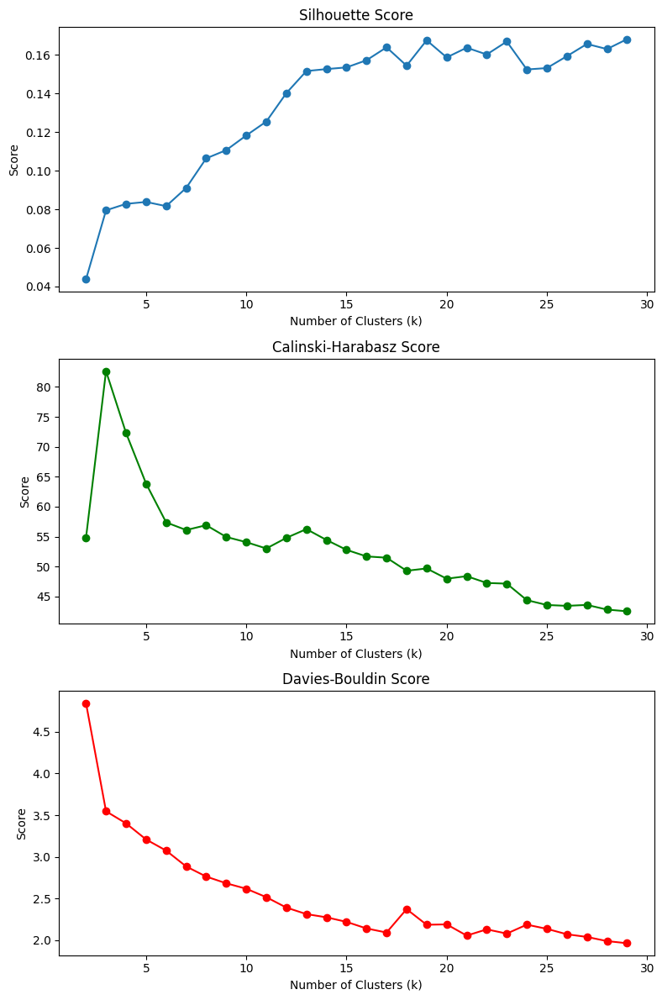

In [15]:
# Store scores for different cluster numbers
k_values = range(2, 30)  # Up to len(traces)-1
silhouette_scores = []
calinski_scores = []
davies_scores = []

# Run KMeans and calculate clustering scores
for k in tqdm(k_values):
    # clustering = SpectralClustering(n_clusters=k, assign_labels='discretize', random_state=0).fit(X)
    # labels = clustering.labels_
    kmeans = KMeans(n_clusters=k, random_state=42)
    labels = kmeans.fit_predict(X)

    silhouette_scores.append(silhouette_score(X, labels))
    calinski_scores.append(calinski_harabasz_score(X.toarray(), labels))
    davies_scores.append(davies_bouldin_score(X.toarray(), labels))

# Plotting
fig, axs = plt.subplots(3, 1, figsize=(8, 12))

# Silhouette Score
axs[0].plot(k_values, silhouette_scores, marker='o')
axs[0].set_title("Silhouette Score")
axs[0].set_xlabel("Number of Clusters (k)")
axs[0].set_ylabel("Score")

# Calinski-Harabasz Index
axs[1].plot(k_values, calinski_scores, marker='o', color='green')
axs[1].set_title("Calinski-Harabasz Score")
axs[1].set_xlabel("Number of Clusters (k)")
axs[1].set_ylabel("Score")

# Davies-Bouldin Index (lower is better)
axs[2].plot(k_values, davies_scores, marker='o', color='red')
axs[2].set_title("Davies-Bouldin Score")
axs[2].set_xlabel("Number of Clusters (k)")
axs[2].set_ylabel("Score")

plt.tight_layout()
plt.show()

In [16]:
spect = SpectralClustering(n_clusters=10, random_state=42)
labels = spect.fit_predict(X)


    ################################
    #           Cluster 0         #
    ################################
    


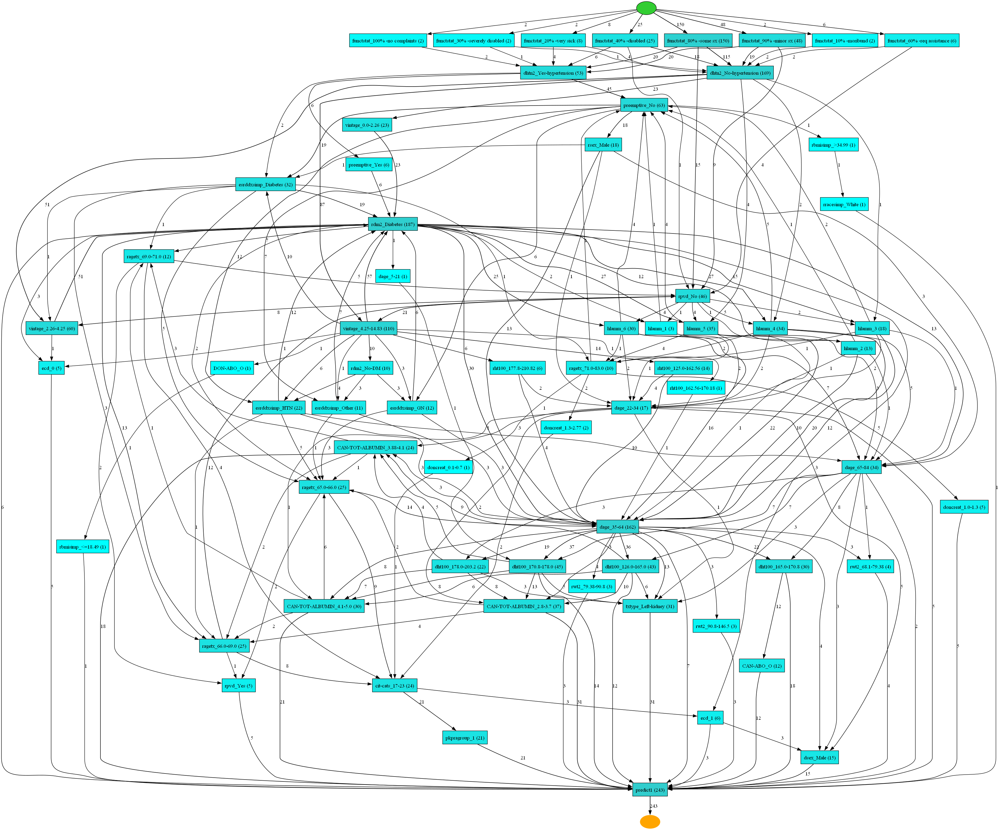


    ################################
    #           Cluster 1         #
    ################################
    


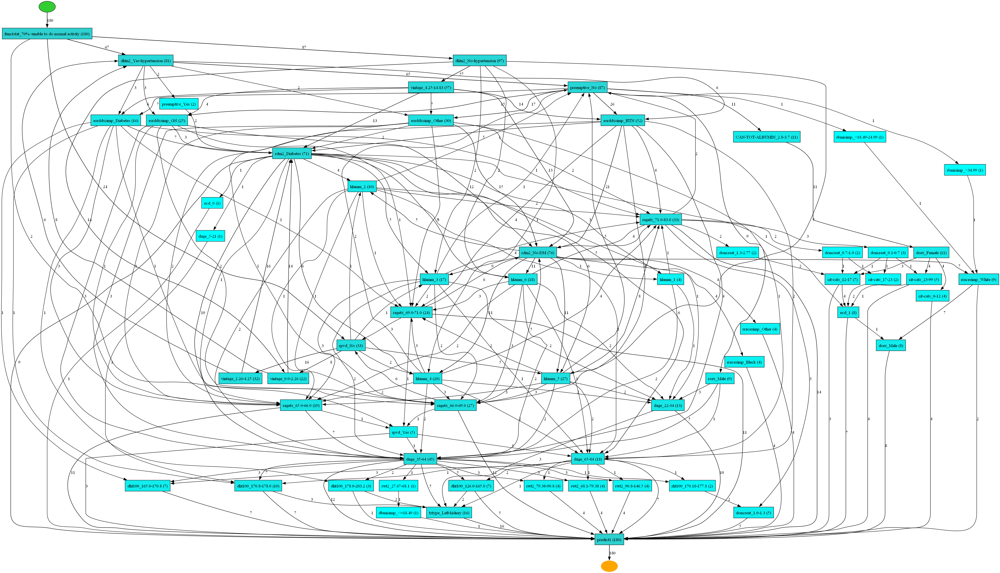


    ################################
    #           Cluster 2         #
    ################################
    


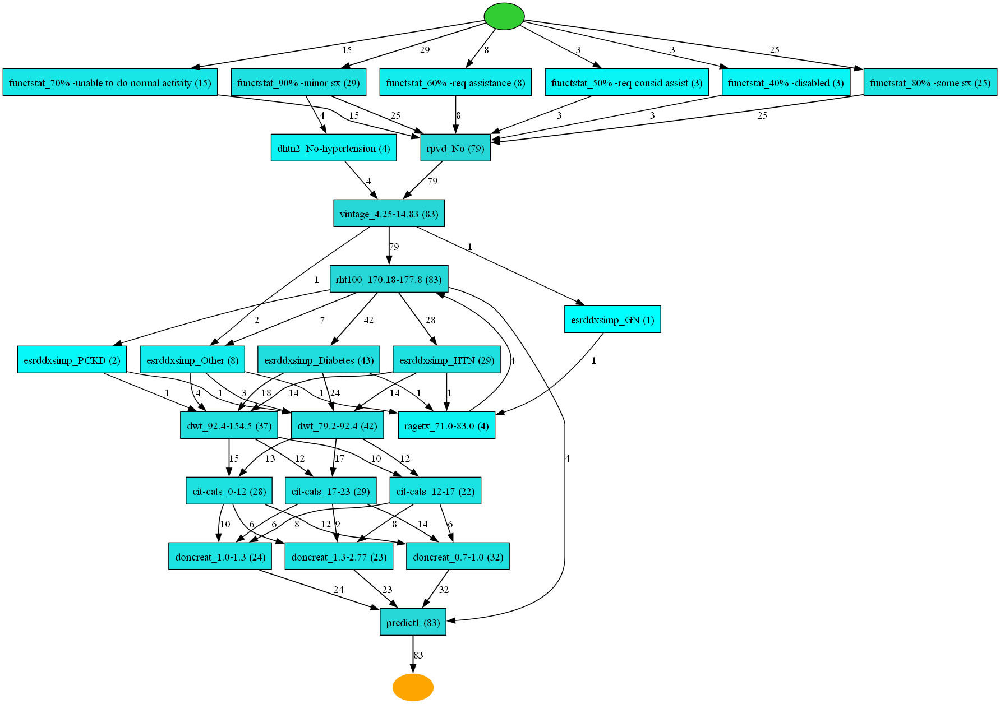


    ################################
    #           Cluster 3         #
    ################################
    


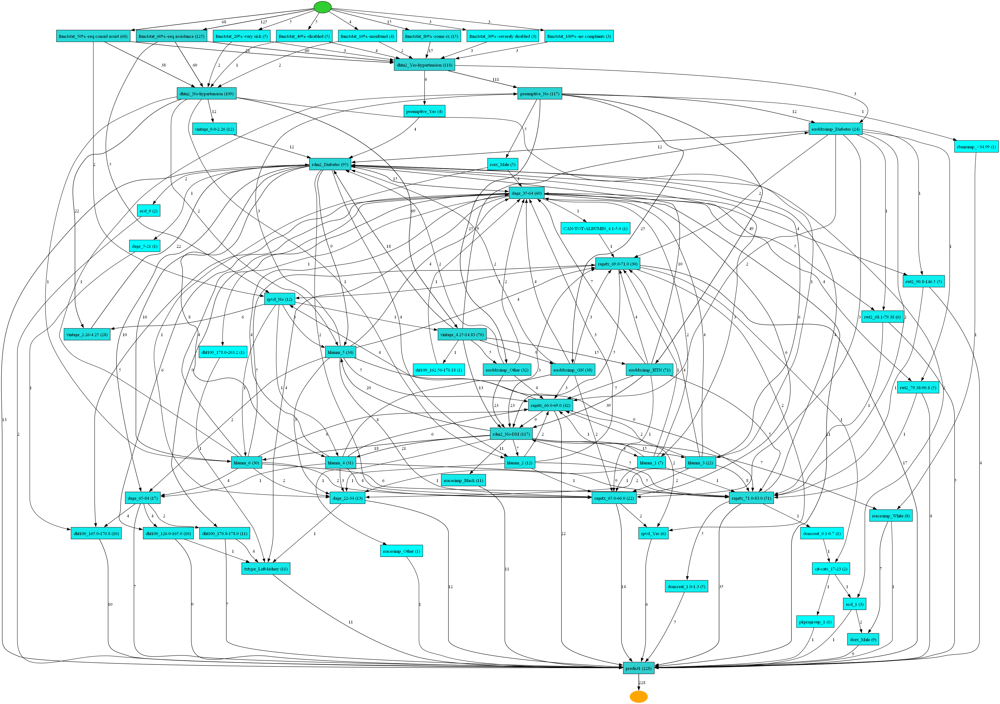


    ################################
    #           Cluster 4         #
    ################################
    


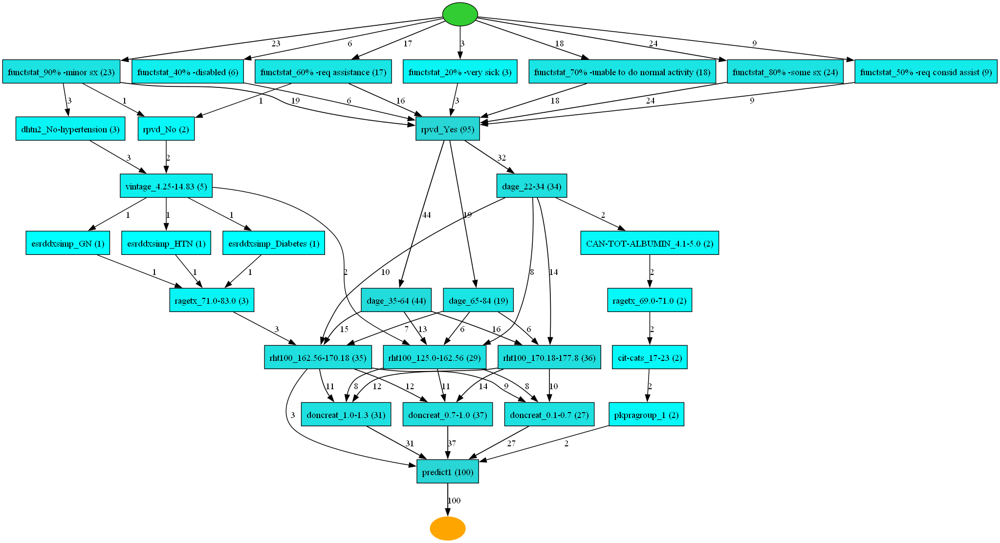


    ################################
    #           Cluster 5         #
    ################################
    


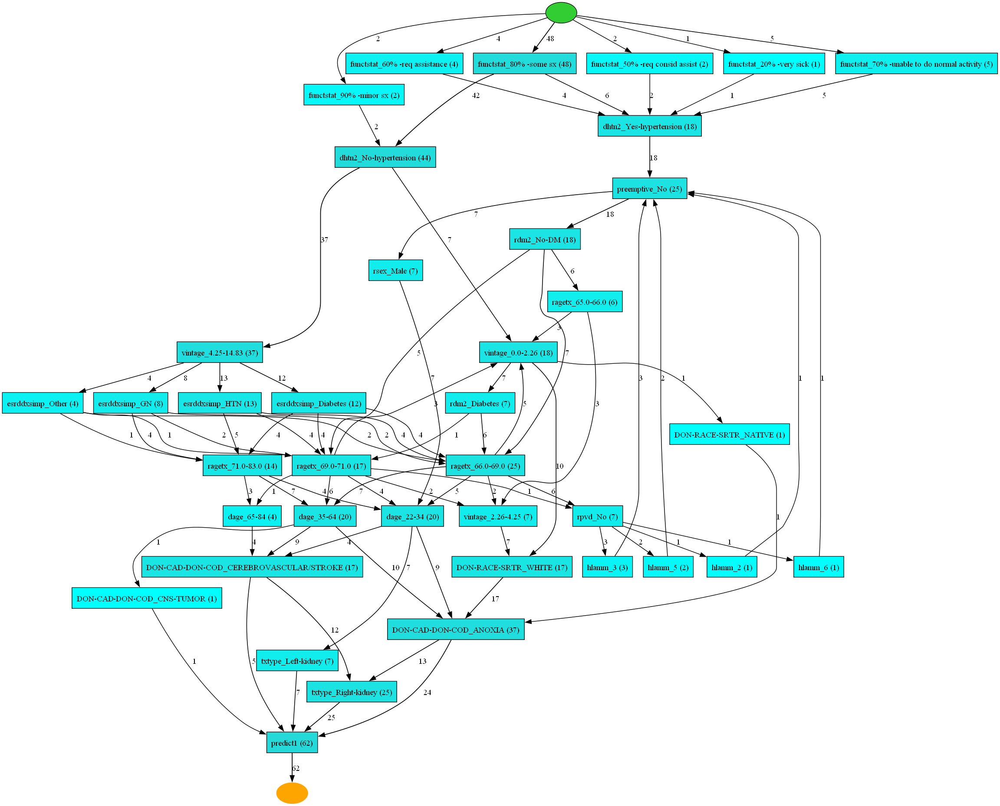


    ################################
    #           Cluster 6         #
    ################################
    


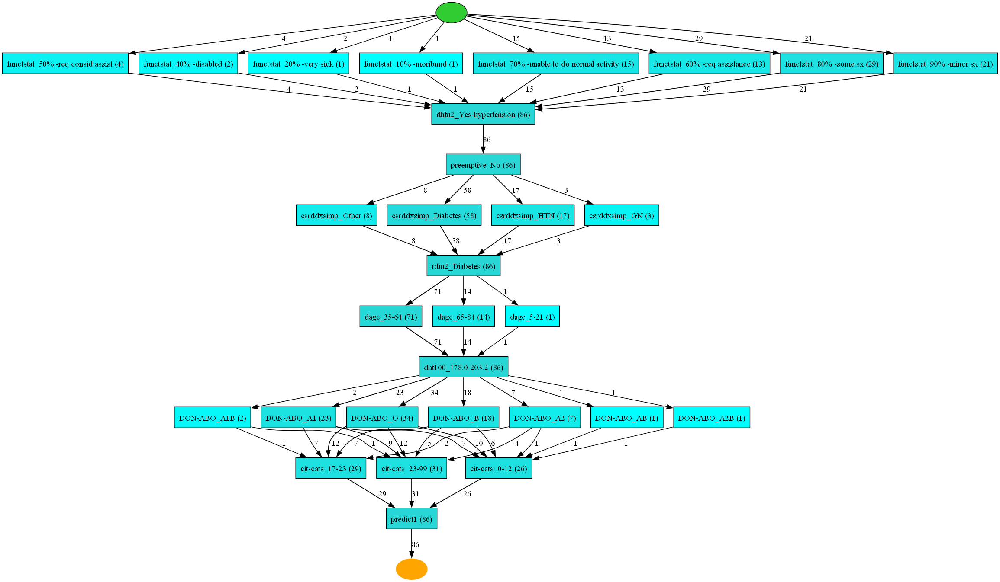


    ################################
    #           Cluster 7         #
    ################################
    


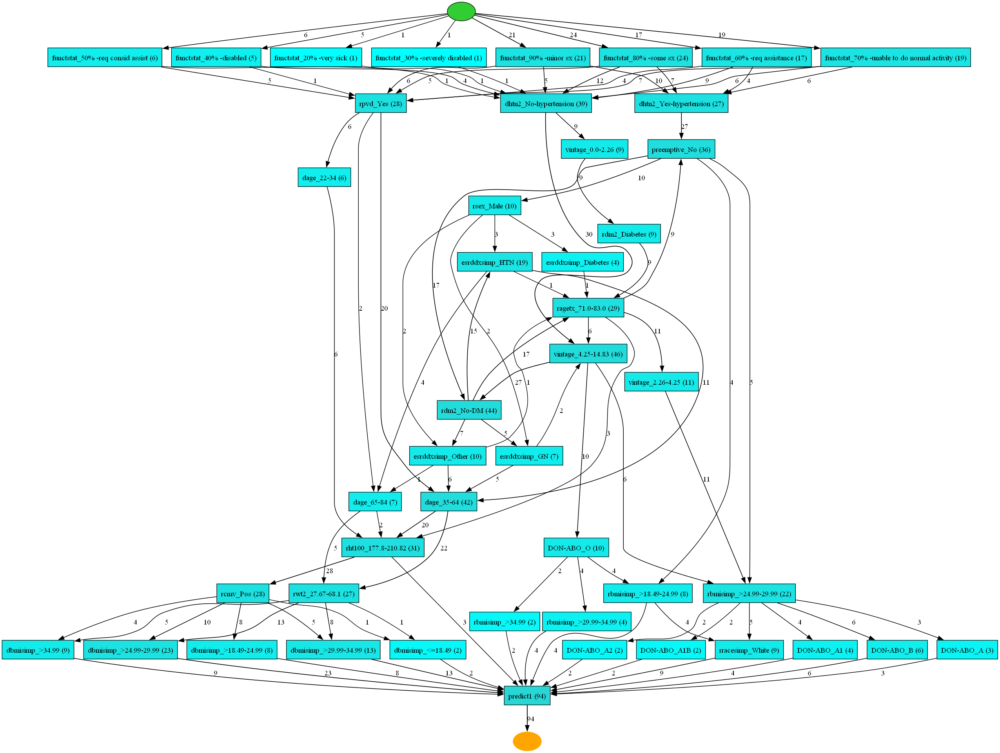


    ################################
    #           Cluster 8         #
    ################################
    


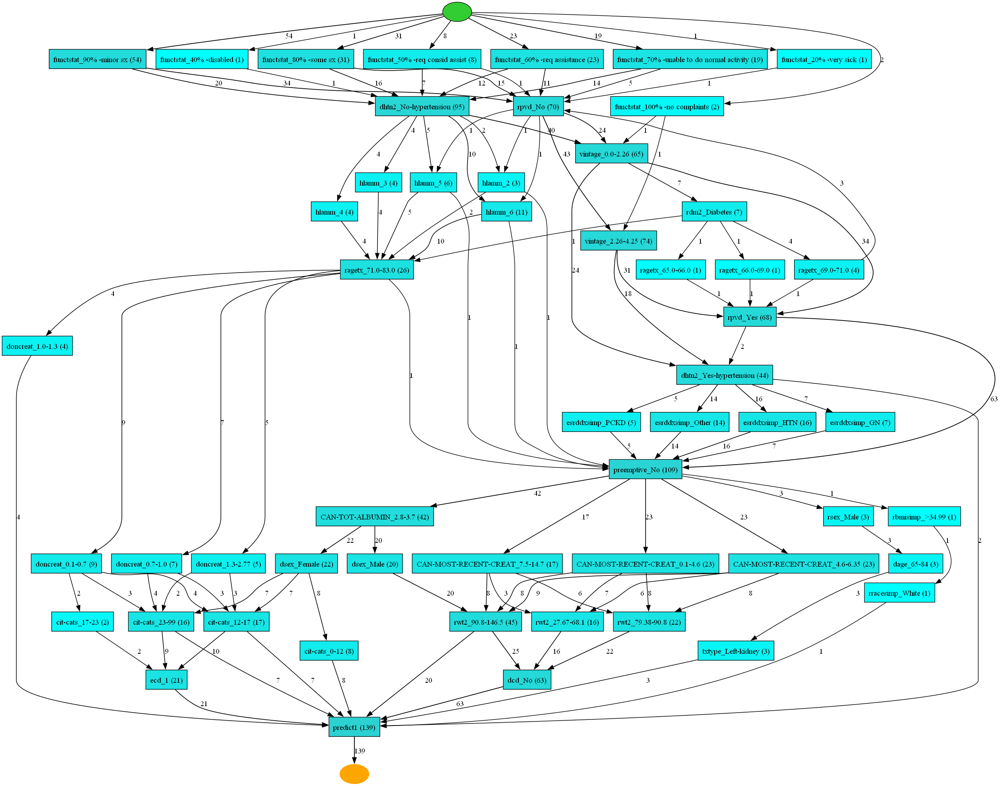


    ################################
    #           Cluster 9         #
    ################################
    


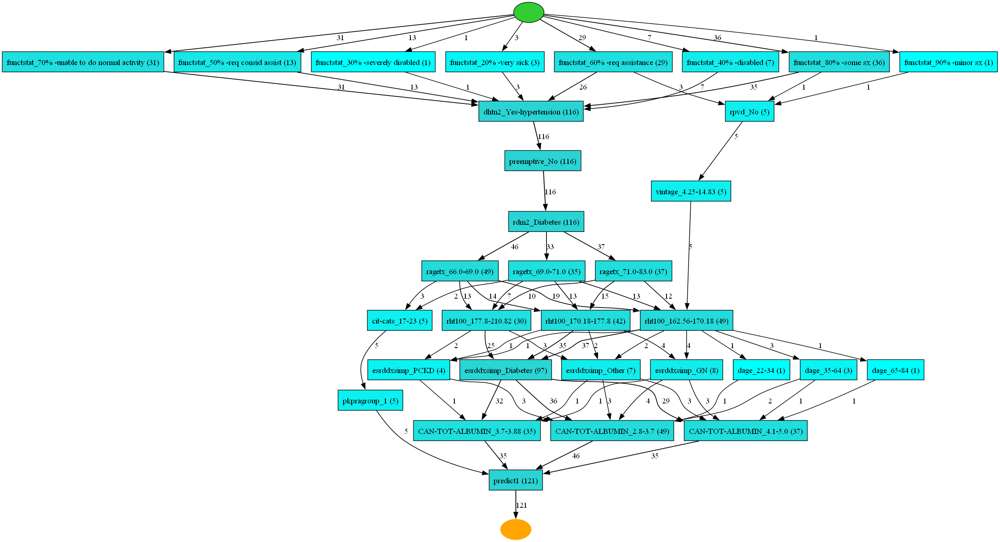

In [17]:
for ix in range(10):
    print("""
    ################################
    #           Cluster {}         #
    ################################
    """.format(ix))
    sequences = df0.iloc[labels==ix]['sequence']
    
    # Create an empty event log
    event_log = EventLog()
    
    # Define base timestamp
    base_time = datetime(2024, 1, 1, 0, 0, 0)
    
    # Loop through each sequence
    for idx, sequence in enumerate(sequences):
        trace = Trace()
        case_id = f"Case_{idx+1}"
        
        for i, activity in enumerate(sequence):
            event = {
                "case:concept:name": case_id,
                "concept:name": activity,
                "time:timestamp": base_time + timedelta(minutes=i)
            }
            trace.append(event)
        
        event_log.append(trace)
    
    heu_net = heuristics_miner.apply_heu(event_log)
    
    # visualize
    gviz = hn_visualizer.apply(heu_net)
    hn_visualizer.view(gviz)

In [18]:
for ix in range(10):
    print(f"###################{ix}#################")
    sequences = df0.iloc[labels==ix]['sequence']
    
    # Create an empty event log
    event_log = EventLog()
    
    # Define base timestamp
    base_time = datetime(2024, 1, 1, 0, 0, 0)
    
    # Loop through each sequence
    for idx, sequence in enumerate(sequences):
        trace = Trace()
        case_id = f"Case_{idx+1}"
        
        for i, activity in enumerate(sequence):
            event = {
                "case:concept:name": case_id,
                "concept:name": activity,
                "time:timestamp": base_time + timedelta(minutes=i)
            }
            trace.append(event)
        
        event_log.append(trace)
    metrics = evaluate_log(event_log, log_name=ix)
    all_results.append(metrics)

# Convert to DataFrame
df_results = pd.DataFrame(all_results)
df_results

###################0#################


replaying log with TBR, completed traces ::   0%|          | 0/243 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/691 [00:00<?, ?it/s]

###################1#################


replaying log with TBR, completed traces ::   0%|          | 0/180 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/386 [00:00<?, ?it/s]

###################2#################


replaying log with TBR, completed traces ::   0%|          | 0/83 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/212 [00:00<?, ?it/s]

###################3#################


replaying log with TBR, completed traces ::   0%|          | 0/228 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/555 [00:00<?, ?it/s]

###################4#################


replaying log with TBR, completed traces ::   0%|          | 0/100 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

###################5#################


replaying log with TBR, completed traces ::   0%|          | 0/62 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/238 [00:00<?, ?it/s]

###################6#################


replaying log with TBR, completed traces ::   0%|          | 0/86 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/254 [00:00<?, ?it/s]

###################7#################


replaying log with TBR, completed traces ::   0%|          | 0/94 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/283 [00:00<?, ?it/s]

###################8#################


replaying log with TBR, completed traces ::   0%|          | 0/139 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/507 [00:00<?, ?it/s]

###################9#################


replaying log with TBR, completed traces ::   0%|          | 0/121 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/299 [00:00<?, ?it/s]

,log_name,fitness_perc_fit_traces,fitness_avg_trace_fitness,fitness_log_fitness,fitness_perc_fitting_traces,precision,generalization,simplicity,metricsAverageWeight,fscore
0,0,100.000000,1.000000,1.00000,100.000000,0.152671,0.623344,0.461538,0.559388,0.264899
1,1,100.000000,1.000000,1.00000,100.000000,0.235744,0.604231,0.603865,0.610960,0.381541
2,2,100.000000,1.000000,1.00000,100.000000,0.280424,0.781488,0.528090,0.647500,0.438017
3,3,100.000000,1.000000,1.00000,100.000000,0.611919,0.750483,0.653333,0.753934,0.759243
4,4,100.000000,1.000000,1.00000,100.000000,0.127265,0.703497,0.530864,0.590407,0.225795
5,5,100.000000,1.000000,1.00000,100.000000,0.927273,0.814577,0.666667,0.852129,0.962264
6,6,100.000000,1.000000,1.00000,100.000000,0.386757,0.718356,0.600000,0.676278,0.557786
7,7,100.000000,1.000000,1.00000,100.000000,0.123731,0.737486,0.563636,0.606213,0.220215
8,8,100.000000,1.000000,1.00000,100.000000,0.447740,0.794402,0.600000,0.710535,0.618536
9,9,100.000000,1.000000,1.00000,100.000000,0.686367,0.764462,0.661538,0.778092,0.814019
